<a href="https://colab.research.google.com/github/alvaroleva/TFG_collabs/blob/main/p02_FeatureSelection_DataVisualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **TFG |AI-based classification of symptomatic subjects with Brugada Syndrome from ECG-derived Markers and clinical data.**
## June 2023, Álvaro Leva Ligero. 

> Director/s: Elena Arbelo, Flavio Palmieri, Pedro Gomis
--------

## **P02 | Feature Selection and Data Visualization.**

In [ ]:
import pandas as pd 
import numpy as np

## *. Load Merged Data
Generated in the previous script [p01_LoadMergeSumm_Data.ipynb](https://colab.research.google.com/drive/1k0GQQOEqTAzdlJnOjknWuSHoArhxJhEV).

In [ ]:
#Code needed to import the Data from GoogleDrive
from google.colab import files
from pydrive.auth import GoogleAuth 
from pydrive.drive import GoogleDrive 
from google.colab import auth 
from oauth2client.client import GoogleCredentials

auth.authenticate_user() 
gauth = GoogleAuth() 
gauth.credentials = GoogleCredentials.get_application_default() 
drive = GoogleDrive(gauth)

data_url = 'https://docs.google.com/spreadsheets/d/1THNdilQ0kPhMHbT_ubnx208ACJVDVTmd/edit?usp=share_link&ouid=111241553451068058703&rtpof=true&sd=true'
id = data_url.split("/")[-2] #get ID
downloaded = drive.CreateFile({'id':id}) #download from ID
downloaded.GetContentFile('dsFinal_biomarkersPlusClinical.xlsx') #Get the file in the Colab working directory

#load all the merged data
data = pd.read_excel('dsImputedBiomarkers_PlusClinical.xlsx', index_col = 0)
data = data.reset_index(drop=True)

As mentioned in the last section of the [previous script](https://colab.research.google.com/drive/1k0GQQOEqTAzdlJnOjknWuSHoArhxJhEV), ``Symptoms_bef_Dg_DIC_wo_vagal`` will be considered our target variable. 

In [ ]:
#Rename 'Symptoms_bef_Dg_DIC_wo_vagal' as 'symp', our target variable
data = data.rename(columns={'Symptoms_bef_Dg_DIC_wo_vagal': 'symp'})

#Move it to the last column for better readability
symp_col = data.pop('symp')
data.insert( len(data.columns), 'symp', symp_col)

#Show data results
data

,BH,Diagnosis_age,Gender,Proband,FH_SCD,FH_SCD_bef_55,Symptoms_bef_Dg_wo_vagal,SD_VF_bef_Dg,sponECGtype1_all,AF_bef_Dg,...,qt_V6,QTc_V6,ST_0_V6,ST_60_V6,ST_slope_V6,PR_V6,LP_QRSd_V6,LP_RMS40_V6,LP_LAS_V6,symp
0,1,49,1,1,1,1.0,0,0,1,0.0,...,0.426,479.634120,0.114049,0.099740,-0.238484,0.216,79.0,15.969734,31.0,0
1,1,49,1,1,1,1.0,0,0,1,0.0,...,0.426,508.969256,0.131909,0.098811,-0.551632,0.219,82.0,17.210309,33.0,0
2,1,49,1,1,1,1.0,0,0,1,0.0,...,0.407,493.999389,0.135950,0.077048,-0.981696,0.215,82.0,16.221674,34.0,0
3,1,49,1,1,1,1.0,0,0,1,0.0,...,0.412,470.283612,0.123019,0.058792,-1.070458,0.213,81.0,16.741394,33.0,0
4,1,49,1,1,1,1.0,0,0,1,0.0,...,0.419,478.138960,0.118188,0.069585,-0.810037,0.214,81.0,16.993143,32.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26299,110,38,0,1,1,1.0,0,0,0,0.0,...,0.396,394.782956,0.014946,0.071510,0.942732,0.199,111.0,10.362226,44.0,0
26300,110,38,0,1,1,1.0,0,0,0,0.0,...,0.397,390.143153,0.018117,0.071957,0.897337,0.196,112.0,10.092416,44.0,0
26301,110,38,0,1,1,1.0,0,0,0,0.0,...,0.396,386.601336,0.018687,0.076640,0.965896,0.196,111.0,10.612109,43.0,0
26302,110,38,0,1,1,1.0,0,0,0,0.0,...,0.397,392.389449,0.023788,0.078426,0.910627,0.196,112.0,10.042074,43.0,0


### KNN Data imputation
Before applying a ML technique to find the best biomarkers something has to be done with missing values (NaNs). 

First let's see if we can treat missing values simply by dropping the rows containing NaN. As we have an umbalance dataset in which the symptomatic condition (symp = 1) is scarce, before simply dropping the rows we have to see if this would entail loosing so many symptomatic data. 

In [ ]:
nan_rows = data.isnull().any(axis = 1) #get the rows that contain NaNs
data_nan = data[nan_rows] #get the rows with nans
data_nan.symp.value_counts() #see  the symp class of these rows
print('From a total of {} of rows pertaining to symptomatic class, {} contain NaNs: {:.2f} %'.format(data.symp.value_counts()[1], data_nan.symp.value_counts()[1], data_nan.symp.value_counts()[1] / data.symp.value_counts()[1]*100 ))

From a total of 4089 of rows pertaining to symptomatic class, 2799 contain NaNs: 68.45 %


Given that a half of symptomatic data contain missing values, is better to perform **data imputation** instead of directly discard those rows. Thus, we can conduct KNN imputation on biomarker data (numerical data) to fill the NaNs with coherent values. 

In [ ]:
#take the first index from which the biomarkers' data start
ini_bmk = data.columns.get_loc('Pavg_I')

#Let's do the imputation of numerical data, corresponding to the biomarkers
data_bmk_only = data.iloc[:,ini_bmk:-1] #exclude the last column corresponding to `symp` target variable.

In [ ]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2)
imputer.fit(data_bmk_only)
imputation = imputer.transform(data_bmk_only)
data_imput = pd.DataFrame(imputation, columns = data_bmk_only.columns )
data_imput_tot = pd.concat([data.drop(data_bmk_only.columns, axis=1) , data_imput], axis=1) #merge again the clinical data to the imputated numerical biomarkers

In [ ]:
# #Save the resulting data imputation in excel
# from google.colab import files

# # data_imput.to_excel('dsImputedBiomarkers.xlsx')
# data_imput_tot.to_excel('dsImputedBiomarkers_PlusClinical.xlsx')

# # download the file to your local PC
# # files.download('dsImputedBiomarkers.xlsx')
# files.download('dsImputedBiomarkers_PlusClinical.xlsx')

> https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html

# 3. Biomarker selection
In this section a study of the biomarkers will be conducted to assess their discriminative value between the asymptomatic and symptomatic condition. 

## 3.1 Correlation matrices

#### A. ONLY ECG-derived biomarkers: correlation among them and with symp for each lead. 

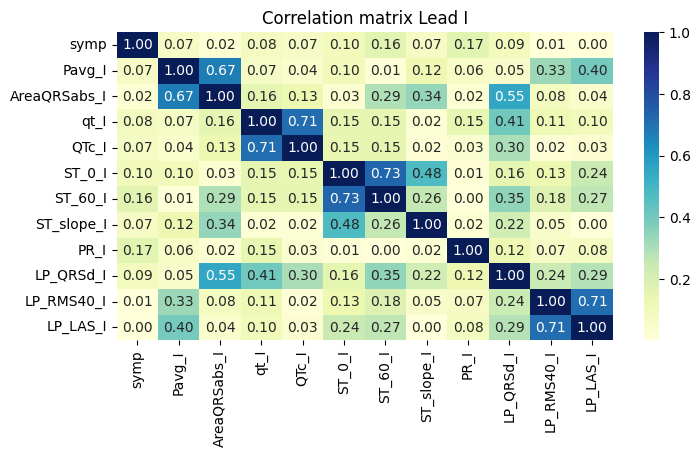

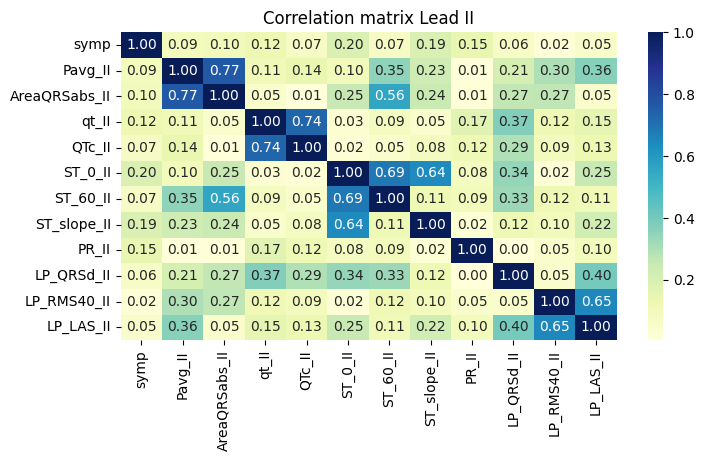

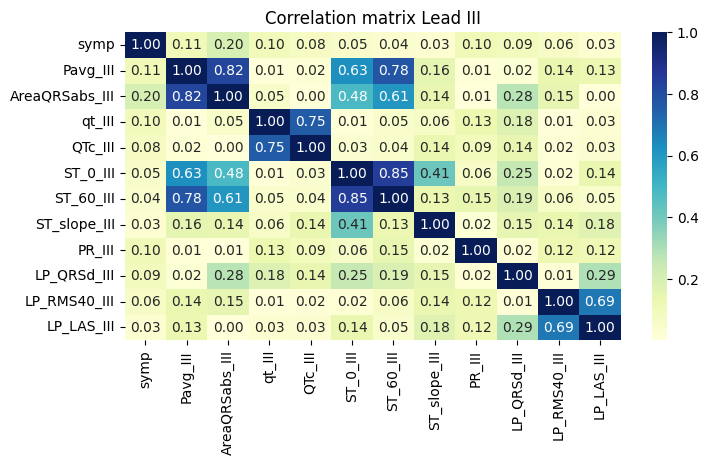

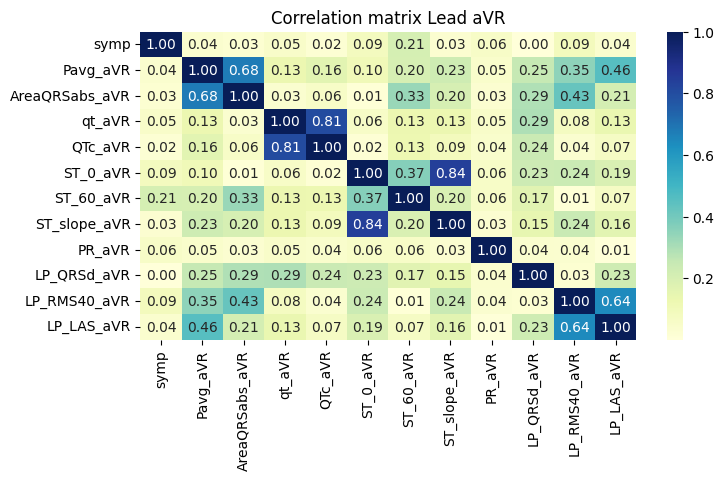

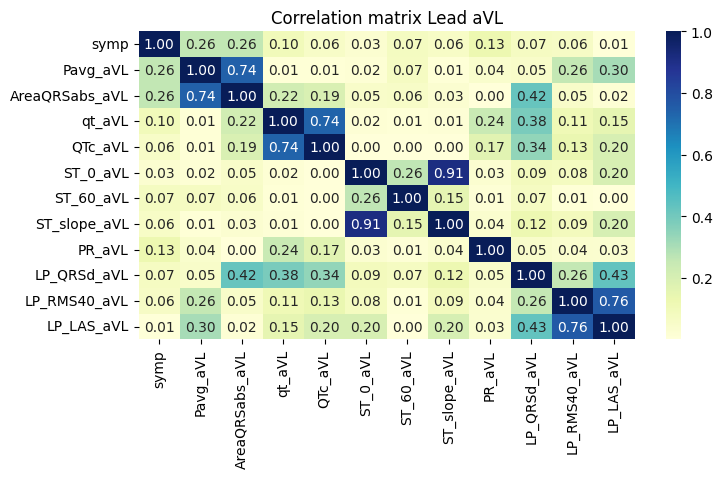

...

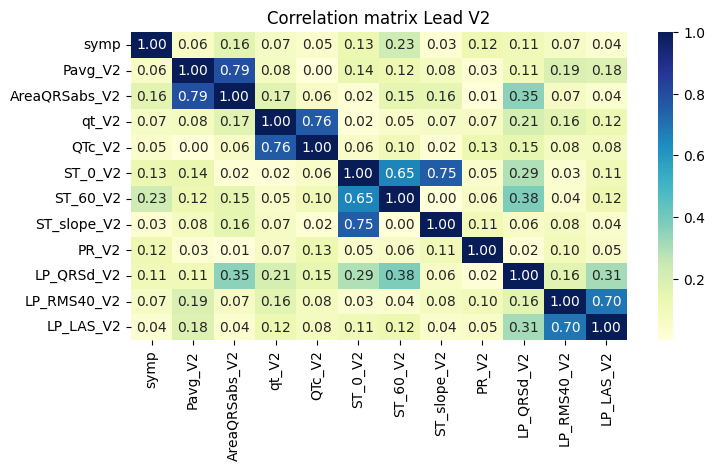

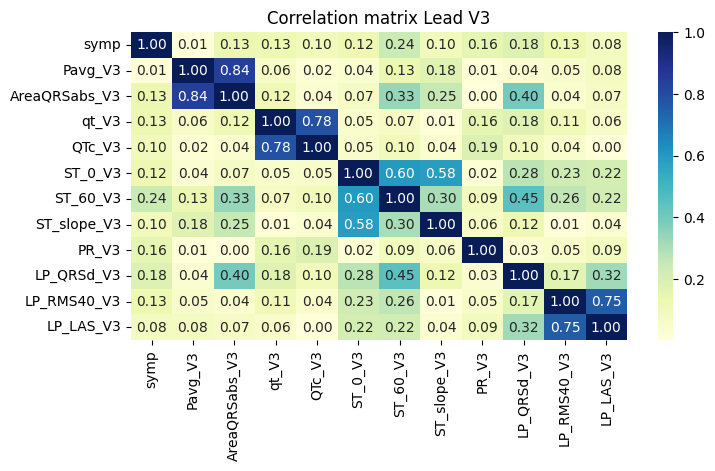

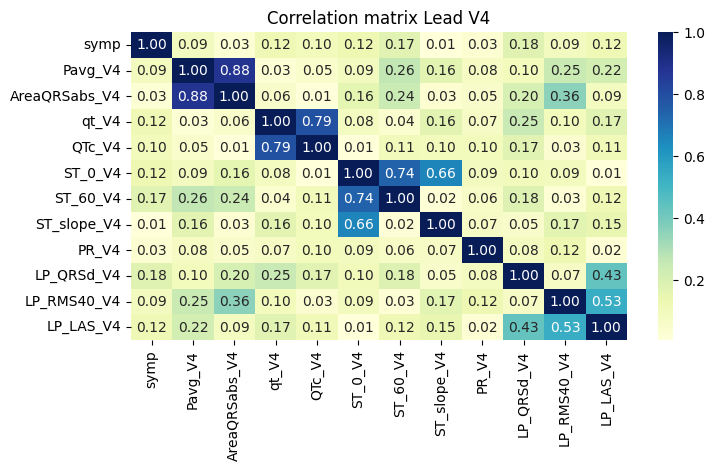

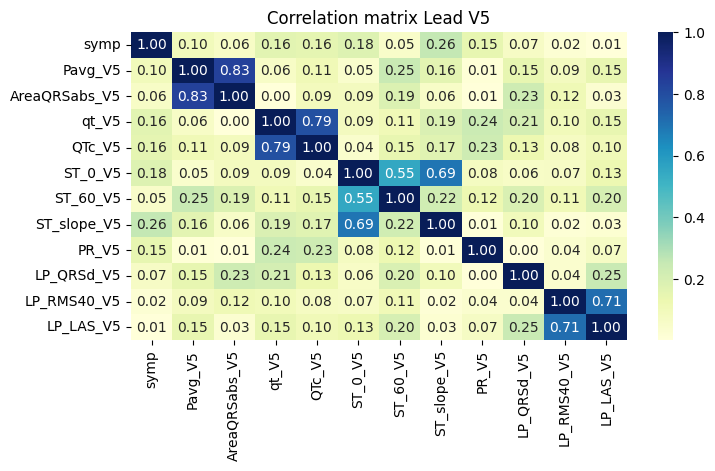

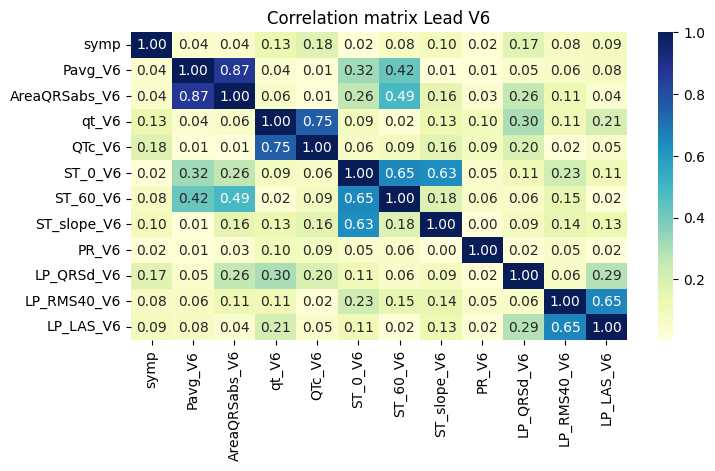

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sb
leads = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
ini = ini_bmk #the first 13th columns correspond to clinical Data

data.symp = data.symp.astype(float) #numerical data needed
for iLead in range(12):
  end = ini + 11
  data_iLead = data.iloc[:,[-1] + list(range(ini,end)) ] #select the sympt column [-1] plus the 11 corresponding lead biomarkers
  corr = data_iLead.corr()
  plt.figure(figsize = (8,4))
  corr_plot = sb.heatmap(abs(corr), cmap="YlGnBu", annot=True, fmt='.2f')
  plt.title('Correlation matrix Lead {}'.format(leads[iLead]))
  plt.show()
  ini = end

#### B. Addition of clinical data: correlation of the clinical data with ECG-derived biomarkers and with ``symp`` target variable. 

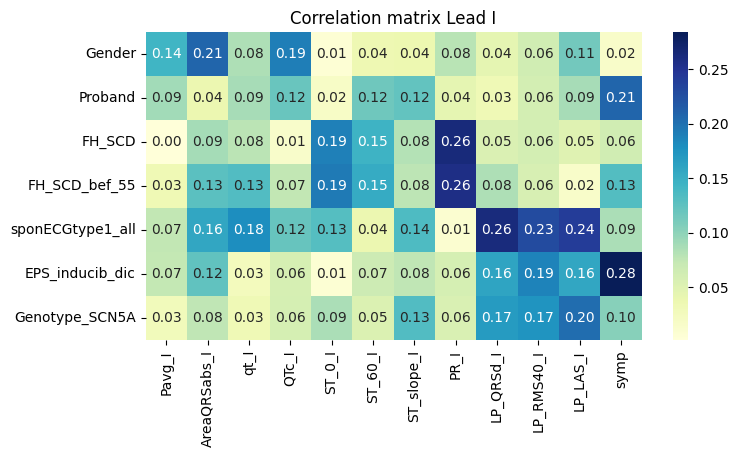

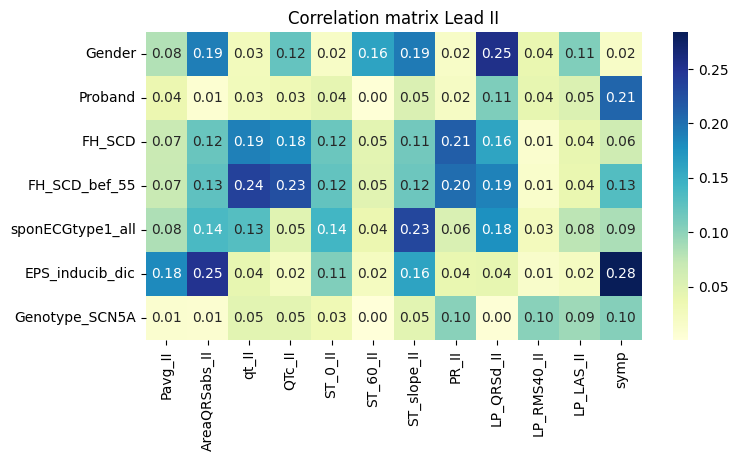

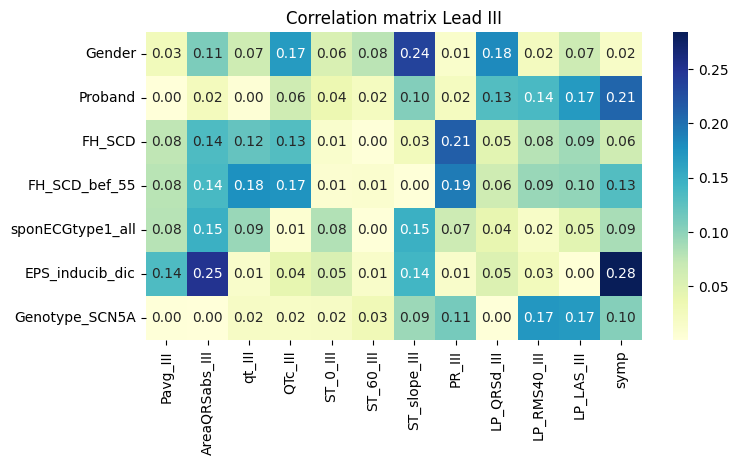

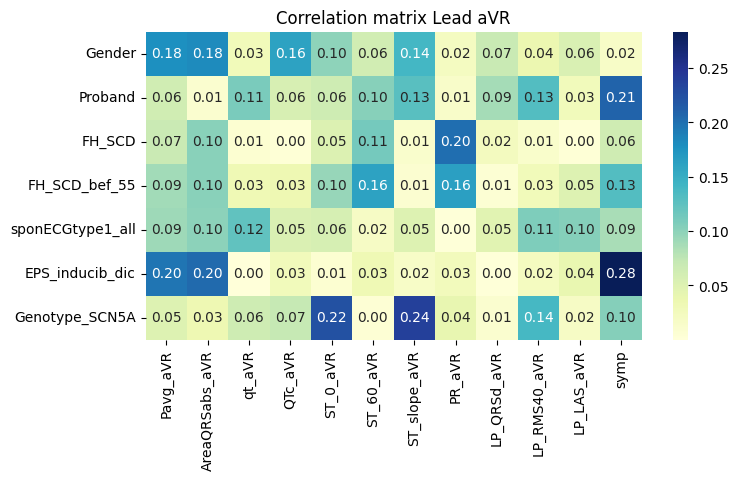

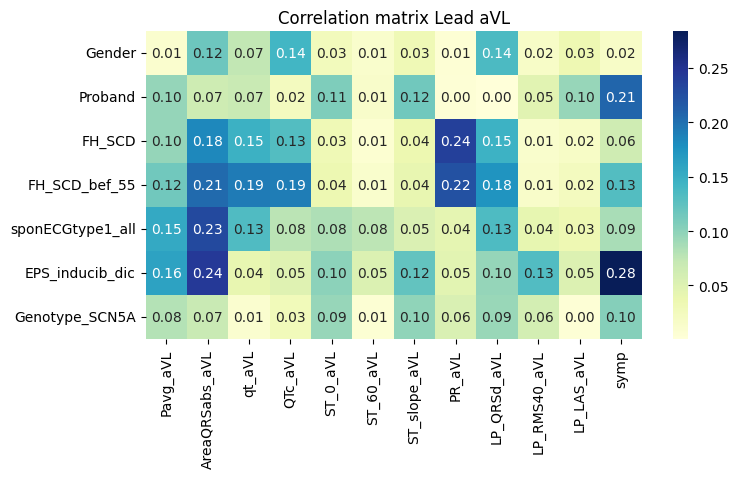

...

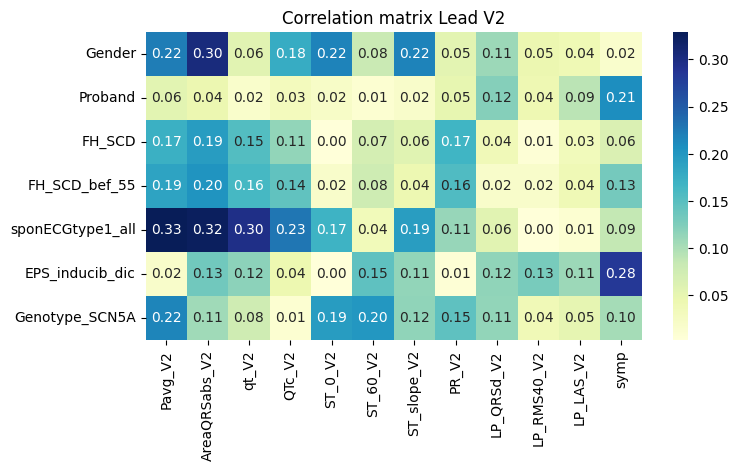

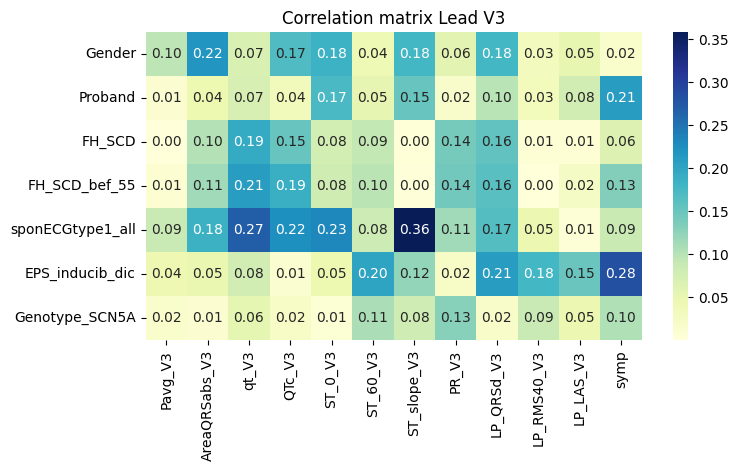

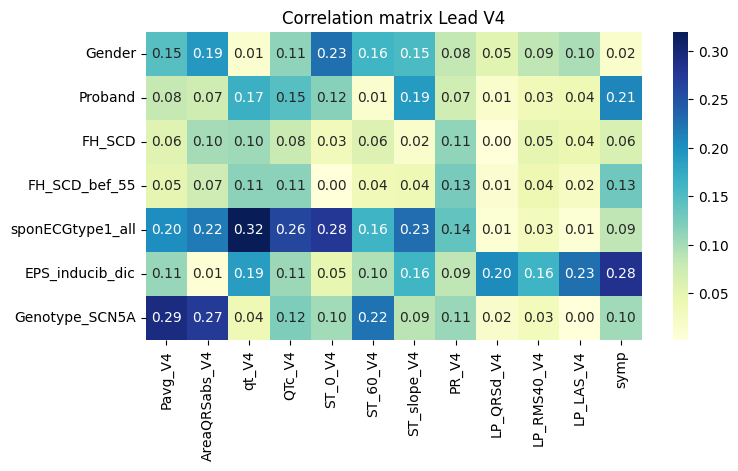

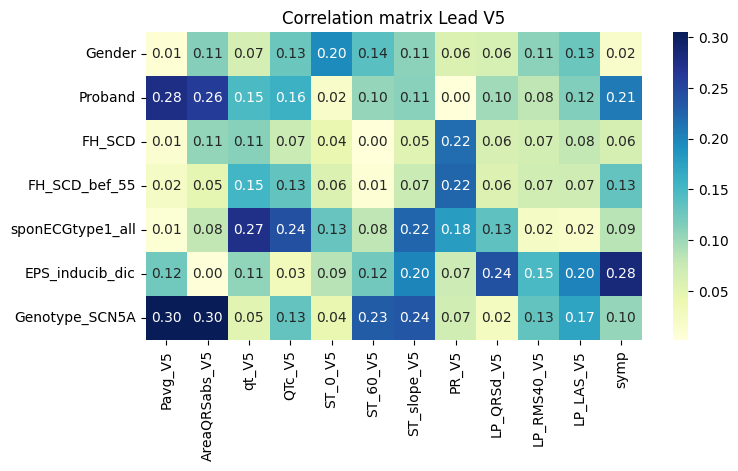

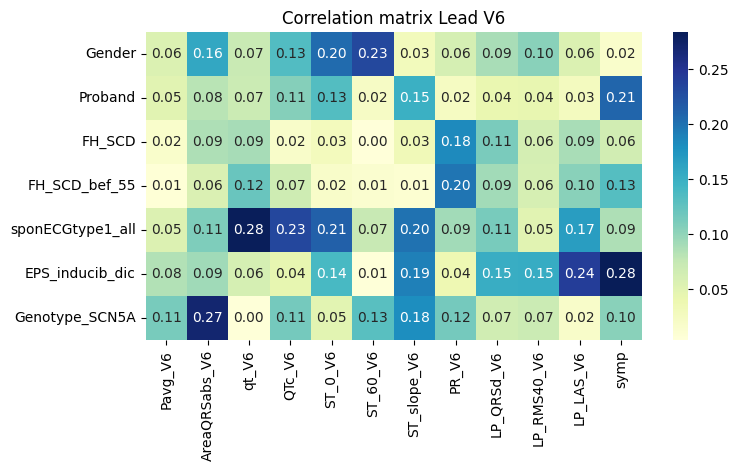

In [ ]:
leads = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
ini = ini_bmk #the first 13th columns correspond to clinical Data
clinical_vars_study_idx = [2,3,4,5,8,10,11]

data.symp = data.symp.astype(float) #numerical data needed
for iLead in range(12):
    end = ini + 11 #to select the 11 biomarkers for each lead
    lead_cols = list(range(ini, end))
    clinical_data = data.iloc[:, clinical_vars_study_idx] #select clinical vars
    biomarker_data = data.iloc[:, lead_cols + [-1]] #select 11 lead biomarkers
    data_lead = pd.concat([clinical_data, biomarker_data], axis=1) #concatenate clinical and biomarker data

    corr = data_lead.corr() #compute correlation
    corr_biomarkers = corr.iloc[:len(clinical_vars_study_idx), len(clinical_vars_study_idx):] #select only the correlation of the clinical data with the biomarkers
    plt.figure(figsize=(8, 4))
    corr_plot = sb.heatmap(abs(corr_biomarkers), cmap="YlGnBu", annot=True, fmt='.2f')
    plt.title('Correlation matrix Lead {}'.format(leads[iLead]))
    plt.show()
    ini = end

## 3.2 Best features search

### 3.2.1 Correlation approach

Let's focus on the correlation of with our target variable ``symp``. For each lead, the **top 5 most correlated biomarkers** with the symptomatic/asymptomatic condition are showed. 

In [ ]:
#See the top 5 features with higher correlation in absolute value (both positive/negative correlation must be considered)
leads = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
ini = ini_bmk #exclude clinical vars
data.symp = data.symp.astype(float) #numerical data needed
for iLead in range(12):
  end = ini + 11
  data_iLead = data.iloc[:,[-1] + list(range(ini,end)) ] #select the sympt column [-1] plus the 11 corresponding lead biomarkers
  corr = data_iLead.corr()
  symp_corr = corr.loc['symp']
  best_5ft_corr = abs(symp_corr).nlargest(6).iloc[1:]
  print('\033[1mLead {} best 5 biomarkers\033[0m'.format(leads[iLead]),best_5ft_corr, sep = '\n')
  print('\n -----------------------------------------------')
  ini = end

Lead I best 5 biomarkers
PR_I         0.165178
ST_60_I      0.162283
ST_0_I       0.099989
LP_QRSd_I    0.090821
qt_I         0.083840
Name: symp, dtype: float64

 -----------------------------------------------
Lead II best 5 biomarkers
ST_0_II          0.195366
ST_slope_II      0.192151
PR_II            0.146696
qt_II            0.123660
AreaQRSabs_II    0.101784
Name: symp, dtype: float64

 -----------------------------------------------
Lead III best 5 biomarkers
AreaQRSabs_III    0.201376
Pavg_III          0.108414
PR_III            0.104486
qt_III            0.101296
LP_QRSd_III       0.089456
Name: symp, dtype: float64

 -----------------------------------------------
Lead aVR best 5 biomarkers
ST_60_aVR       0.206867
LP_RMS40_aVR    0.090121
ST_0_aVR        0.085291
PR_aVR          0.055683
qt_aVR          0.052140
Name: symp, dtype: float64

 -----------------------------------------------
Lead aVL best 5 biomarkers
Pavg_aVL          0.261102
AreaQRSabs_aVL    0.258123
PR_aVL

In [ ]:
# data_wo_na = data.dropna()

# from scipy.stats import pointbiserialr
# # x is a numerical variable and y is a dichotomous variable (0 or 1)
# correlation, p_value = pointbiserialr(data_wo_na['LP_QRSd_V2'],data_wo_na.symp)

# print("Point-biserial correlation coefficient: ", correlation)
# print("P-value: ", p_value)


In [ ]:
#See the top 60 features with higher correlation with symp considering ALL leads
data_bmk_totLeads = data.iloc[:,ini_bmk:] 
corr = data_bmk_totLeads.corr()
symp_corr = corr.loc['symp']
best_60ft_corr = abs(symp_corr).nlargest(61).iloc[1:]
best_60ft_corr

Pavg_aVL          0.261102
AreaQRSabs_aVL    0.258123
ST_slope_V5       0.257917
ST_60_V3          0.238538
ST_60_V2          0.229562
ST_60_aVR         0.206867
AreaQRSabs_III    0.201376
ST_0_II           0.195366
ST_slope_II       0.192151
LP_QRSd_V3        0.182030
ST_0_V5           0.180273
LP_QRSd_V4        0.179238
QTc_V6            0.176083
ST_60_V1          0.174456
ST_0_aVF          0.172850
AreaQRSabs_aVF    0.172684
ST_60_V4          0.171066
LP_QRSd_V6        0.168831
PR_I              0.165178
qt_V5             0.163217
ST_60_I           0.162283
AreaQRSabs_V2     0.161136
ST_slope_aVF      0.160378
PR_V3             0.157940
QTc_V5            0.156778
LP_QRSd_V1        0.153320
PR_V5             0.148481
PR_II             0.146696
AreaQRSabs_V3     0.133263
qt_V6             0.132963
ST_0_V2           0.131239
PR_aVF            0.130482
LP_RMS40_V3       0.128953
qt_V3             0.127456
PR_aVL            0.126344
ST_0_V4           0.124837
qt_II             0.123660
S

### 3.2.2 Tree Classifier approach

Now a global search is performed based on Tree Classifiers. The **60 best biomarkers** are selected considering **all leads**.

Once missing values have been imputated, Machine Learning approaches can be conducted to assess the best features. 

Independent variables (X = biomarkers) shape: (26304, 132)
Target variable (y = symp) shape: (26304,)


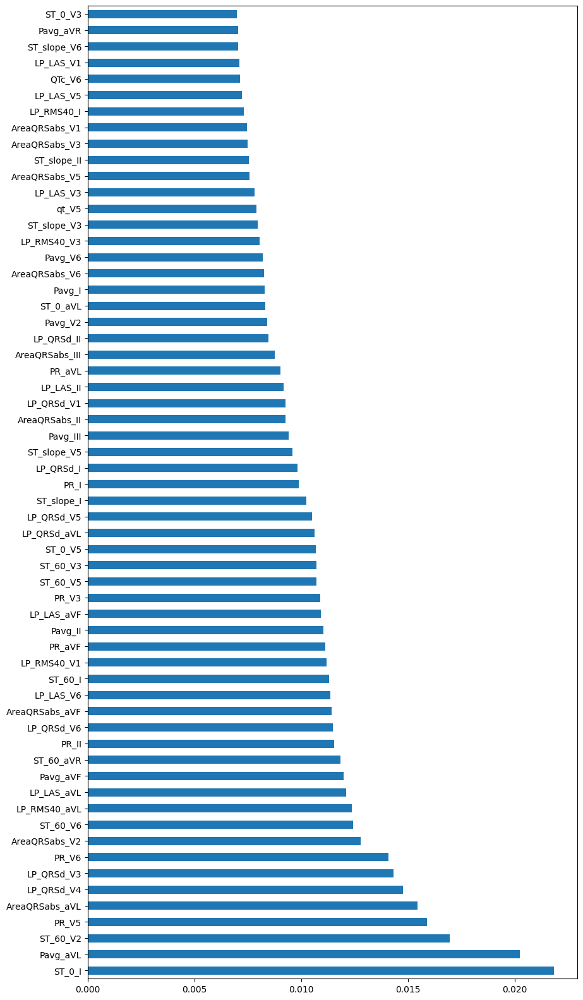

In [ ]:
X = data_imput  #take independent columns ONLY THE 132 ECG-derived BIOMARKERS
y = data_imput_tot.symp #take target column

print('Independent variables (X = biomarkers) shape: {}\nTarget variable (y = symp) shape: {}'.format(X.shape, y.shape))
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(random_state = 0)
model.fit(X,y)

plt.figure(figsize = (10,20))
feat_importances = pd.Series(model.feature_importances_, index = X.columns)
feat_importances.nlargest(60).plot(kind = 'barh')
plt.show()
best_60ft_tree = feat_importances.nlargest(60)

### 3.2.3 Univariate selection


As before, the 60 best biomarkers are selected considering all leads. Now performing univariate selection.

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = X.astype(float) #work with numerical data

bestfeatures = SelectKBest(score_func = chi2, k = 10)
fit = bestfeatures.fit(abs(X),y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns, dfscores], axis = 1)
featureScores.columns = ['Features', 'Score']
print(featureScores.nlargest(60,'Score'))
best_60ft_univ = featureScores.nlargest(60,'Score').Features

           Features         Score
23   AreaQRSabs_III  26852.344773
108     LP_RMS40_V4  21700.739984
45   AreaQRSabs_aVL  19295.071599
56   AreaQRSabs_aVF  14314.328154
42     LP_RMS40_aVR  13788.979823
96       LP_QRSd_V3  12337.993197
74       LP_QRSd_V1  11438.236756
107      LP_QRSd_V4  10100.602778
97      LP_RMS40_V3   9195.398490
130     LP_RMS40_V6   8785.564600
78    AreaQRSabs_V2   8749.083805
89    AreaQRSabs_V3   8683.202775
124          QTc_V6   7457.869101
113          QTc_V5   6489.405613
129      LP_QRSd_V6   5391.176784
86      LP_RMS40_V2   5230.148456
31     LP_RMS40_III   5203.401951
85       LP_QRSd_V2   5128.914406
12    AreaQRSabs_II   4987.228065
67    AreaQRSabs_V1   3911.473530
91           QTc_V3   3878.660452
102          QTc_V4   3273.753943
58          QTc_aVF   3172.418699
8         LP_QRSd_I   3012.646691
64     LP_RMS40_aVF   2904.272626
30      LP_QRSd_III   2772.325320
69           QTc_V1   2512.260043
63      LP_QRSd_aVF   2483.944540
25          QT

### 3.2.4 Best biomarkers
Compare the results from the 3 approaches. Display common features:

In [ ]:
best_60ft_corr_set = set(best_60ft_corr.index)
best_60ft_tree_set = set(best_60ft_tree.index)
best_60ft_univ_set = set(best_60ft_univ)

tot_best_bmk= list(best_60ft_univ_set.intersection(best_60ft_tree_set).intersection(best_60ft_corr_set))
print(tot_best_bmk)

['ST_slope_II', 'AreaQRSabs_aVF', 'AreaQRSabs_V3', 'Pavg_aVL', 'AreaQRSabs_aVL', 'AreaQRSabs_V2', 'AreaQRSabs_III', 'LP_QRSd_V3', 'LP_QRSd_V1', 'LP_QRSd_V4', 'Pavg_aVF', 'Pavg_III', 'ST_slope_V5', 'LP_LAS_V6', 'LP_RMS40_V3', 'QTc_V6', 'AreaQRSabs_V1', 'LP_QRSd_V6', 'AreaQRSabs_II', 'ST_slope_V3']


#### *CHECK*: Assess wheter the clinical variables contain missing values and if so, which BH patients contain the missing values. 

For clinical variables it must be decided whether to discard all the variable if there are many NaNs or discard the single patient. The decision will be based on the following criteria:

* Does the feature contain many patients with NaN values?
* Does the feature show good correlation with the ``symp`` category?
* Does the BH containing this NaN values belong to the symptomatic category (lack of this condition, not suitable to drop all the rows).


In [ ]:
#See the NaN values for each clinical variable and the BH patient containing them
for clc_var in data_imput_tot.columns[0:13]:
  if data_imput_tot[clc_var].isnull().any(): #only display the clinical variables with NaN values
    BHs_wNaN = data_imput_tot.loc[data_imput_tot[clc_var].isnull(), 'BH'].unique()
    print(clc_var, 'Total of BHs with NaNs: {}'.format(len(BHs_wNaN)), sep = '\t')
   
    for bh in BHs_wNaN:
      print(' *',str(bh), data_imput_tot[data_imput_tot.BH == bh].symp.unique()[0])
    print('\n')
#

FH_SCD_bef_55	Total of BHs with NaNs: 1
 * 99 1


AF_bef_Dg	Total of BHs with NaNs: 1
 * 99 1


EPS_inducib_dic	Total of BHs with NaNs: 11
 * 32 0
 * 34 0
 * 77 0
 * 88 0
 * 91 0
 * 99 1
 * 100 0
 * 101 1
 * 103 0
 * 105 0
 * 107 0


Genotype_SCN5A	Total of BHs with NaNs: 13
 * 7 0
 * 18 0
 * 22 0
 * 32 0
 * 37 0
 * 38 0
 * 40 0
 * 78 0
 * 97 0
 * 99 1
 * 101 1
 * 103 0
 * 104 0


Major_Event_woNSVT_FU_DIC	Total of BHs with NaNs: 1
 * 99 1




``EPS_inducib_dic`` is the clinical variable with highest correlation with the symptomatic condition (0.28), our target variable. Therefore, it is better to preserve this clinical variable. 
  - It contains 11 patients with NaN values, this means that removing the patient rows would entail to remove aprox. 11x479 = 5,269. Morover, 2 from these 11 are symptomatic (99 and 101). 
> Best option for this feature is to **redefine NaN as -99** since a NaN only means that the test to induce the episodes is has not been registered in the clinical database or it is not done. 

The same will be done for ``FH_SCD_bef_55`` and ``AF_bef_Dg``. Since only 1 patient contain NaNs. In these cases, the row of BH99 could be removed but as it is symptomatic (``symp = 1``) is preferable to not loose the data from this patient. 

In the case of ``Genotype_SCN5A``, since 13 patients contain NaNs and the correlation with the ``symp`` target variable is not as high (0.11) it has been decided to remove the feature. 

``Major_Event_woNSVT_FU_DIC`` will be also removed since it was initially supposed to be the target variable but, as it was discussed in *section 2.b*, it was discarted.




In [ ]:
#Redefine NaNs as -99
#Set new -99 category
data_imput_tot.EPS_inducib_dic = pd.Categorical(data_imput_tot.EPS_inducib_dic, categories = [0, 1, -99], ordered = False)
data_imput_tot.FH_SCD_bef_55 = pd.Categorical(data_imput_tot.FH_SCD_bef_55, categories = [0, 1, -99], ordered = False)
data_imput_tot.AF_bef_Dg = pd.Categorical(data_imput_tot.AF_bef_Dg, categories = [0, 1, -99], ordered = False)

data_imput_tot.EPS_inducib_dic = data_imput_tot.EPS_inducib_dic.fillna(-99)
data_imput_tot.FH_SCD_bef_55  = data_imput_tot.FH_SCD_bef_55 .fillna(-99)
data_imput_tot.AF_bef_Dg  = data_imput_tot.AF_bef_Dg .fillna(-99)

#Drop Genotype_SCN5A, Major_Event_woNSVT_FU_DIC and also Exclude Symptoms_bef_Dg__wo_vagal
data_imput_tot = data_imput_tot.drop('Genotype_SCN5A', axis=1)
data_imput_tot = data_imput_tot.drop('Major_Event_woNSVT_FU_DIC', axis=1)
data_imput_tot = data_imput_tot.drop('Symptoms_bef_Dg_wo_vagal', axis=1)
data_imput_tot

,BH,Diagnosis_age,Gender,Proband,FH_SCD,FH_SCD_bef_55,SD_VF_bef_Dg,sponECGtype1_all,AF_bef_Dg,EPS_inducib_dic,...,AreaQRSabs_V6,qt_V6,QTc_V6,ST_0_V6,ST_60_V6,ST_slope_V6,PR_V6,LP_QRSd_V6,LP_RMS40_V6,LP_LAS_V6
0,1,49,1,1,1,1,0,1,0,0,...,19.404479,0.426,479.634120,0.114049,0.099740,-0.238484,0.216,79.0,15.969734,31.0
1,1,49,1,1,1,1,0,1,0,0,...,19.724454,0.426,508.969256,0.131909,0.098811,-0.551632,0.219,82.0,17.210309,33.0
2,1,49,1,1,1,1,0,1,0,0,...,19.236563,0.407,493.999389,0.135950,0.077048,-0.981696,0.215,82.0,16.221674,34.0
3,1,49,1,1,1,1,0,1,0,0,...,20.491644,0.412,470.283612,0.123019,0.058792,-1.070458,0.213,81.0,16.741394,33.0
4,1,49,1,1,1,1,0,1,0,0,...,20.532568,0.419,478.138960,0.118188,0.069585,-0.810037,0.214,81.0,16.993143,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26299,110,38,0,1,1,1,0,0,0,0,...,41.421747,0.396,394.782956,0.014946,0.071510,0.942732,0.199,111.0,10.362226,44.0
26300,110,38,0,1,1,1,0,0,0,0,...,40.890811,0.397,390.143153,0.018117,0.071957,0.897337,0.196,112.0,10.092416,44.0
26301,110,38,0,1,1,1,0,0,0,0,...,41.107990,0.396,386.601336,0.018687,0.076640,0.965896,0.196,111.0,10.612109,43.0
26302,110,38,0,1,1,1,0,0,0,0,...,41.602687,0.397,392.389449,0.023788,0.078426,0.910627,0.196,112.0,10.042074,43.0


# 4. Data Visualization

Scatter plot showing the 2-by-2 biomarker correlation, colored by ``symp`` variable to assess how are the symptomatic and asymptomatic patients distributed in each combination of variables. Seven biomarkers from ``tot_best_bmk`` are selectioned. 

In [ ]:
import plotly.express as px
data_imput_tot.symp = pd.Categorical(data_imput_tot.symp, categories = [0, 1], ordered = False) #redefine the symp as categorical type
df = data_imput_tot
fig = px.scatter_matrix( df, dimensions=tot_best_bmk[:7], color="symp", hover_data=['BH'])
fig.update_traces(diagonal_visible=False, marker=dict(size=5))
fig.update_layout(width=1200, height = 1000)
fig.show()

> https://plotly.com/python/pca-visualization/


### 3.1 Interactive Data Visualization with Plotly

In [ ]:
import plotly.express as px
def symp_scatter_ptly(data, bmk_1, bmk_2):
  data.symp = pd.Categorical(data.symp, categories = [0, 1], ordered = False) #redefine the symp as categorical type
  var_1 = data.loc[:,bmk_1]
  var_2 = data.loc[:,bmk_2]
  fig = px.scatter(data_frame=data, x=var_1, y=var_2, color='symp', opacity=0.85, width=750, height=500, hover_data=['BH'])
  fig.show()
  return 

symp_scatter_ptly(data_imput_tot, 'ST_0_V2', 'ST_60_V2')
symp_scatter_ptly(data_imput_tot, 'Pavg_aVL', 'AreaQRSabs_aVL')
symp_scatter_ptly(data_imput_tot, 'ST_0_aVL', 'PR_aVL')



In [ ]:
#3D plot
fig = px.scatter_3d(data_frame=data_imput_tot, x='ST_0_aVL', y = 'ST_60_aVL', z ='AreaQRSabs_aVL', color='symp', opacity=0.85, width=750, height=500, hover_data=['BH'],size_max=11)
fig.show()

### 3.2 Matplotlib Data Visualization

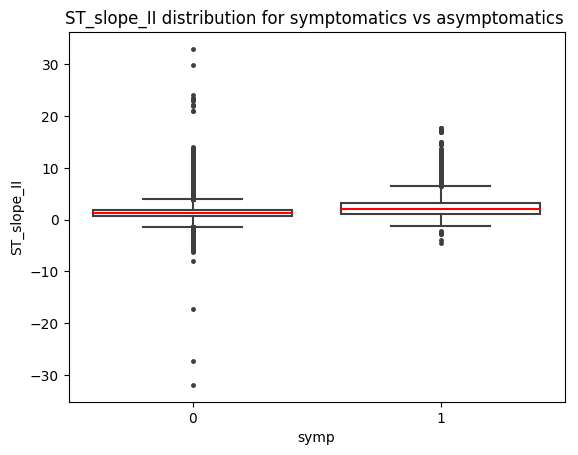

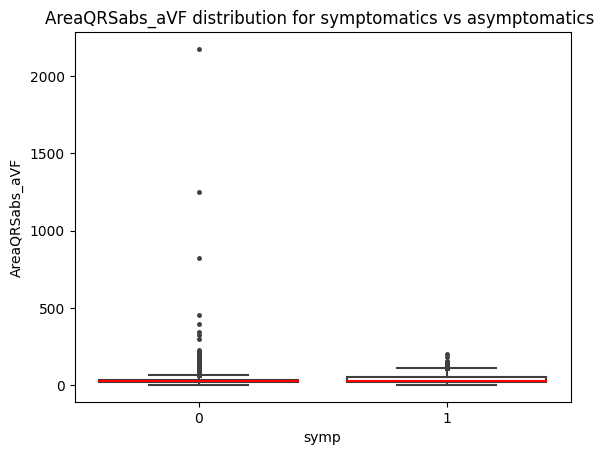

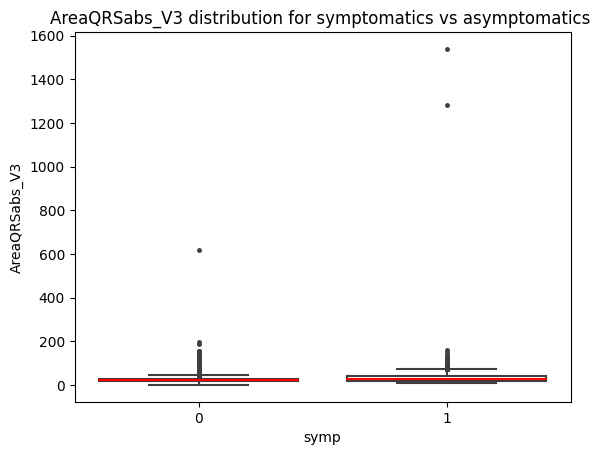

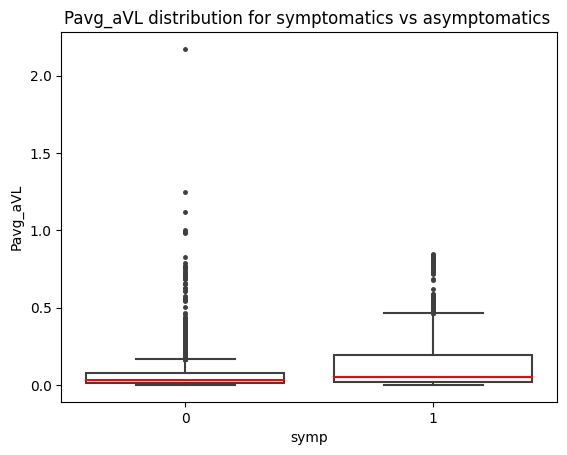

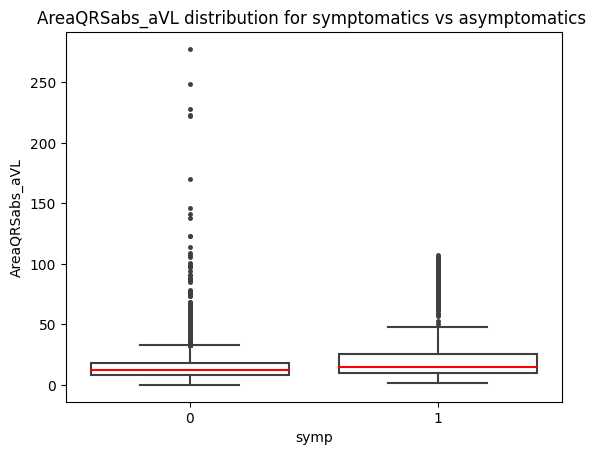

...

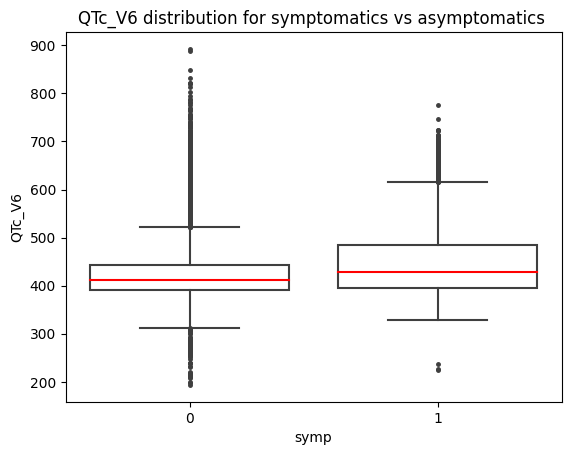

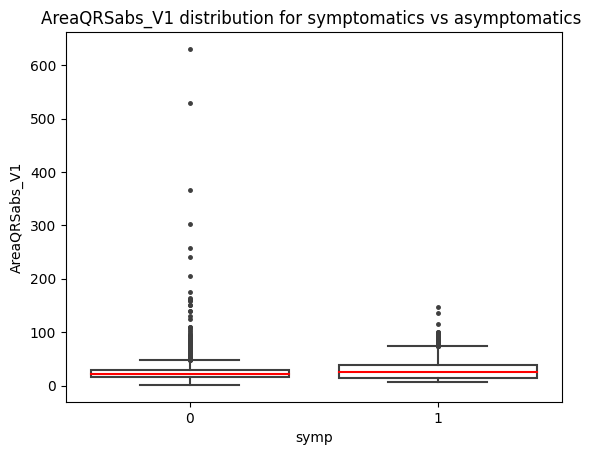

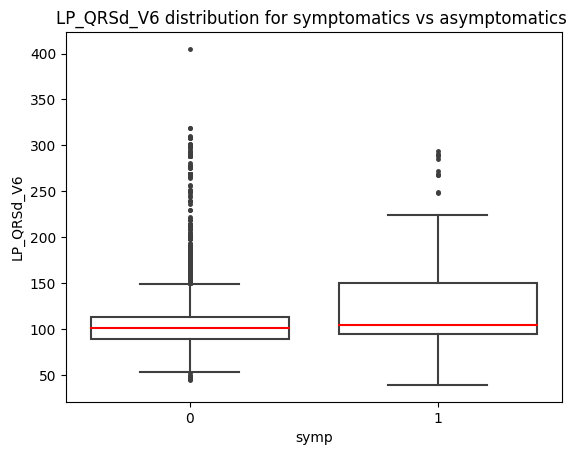

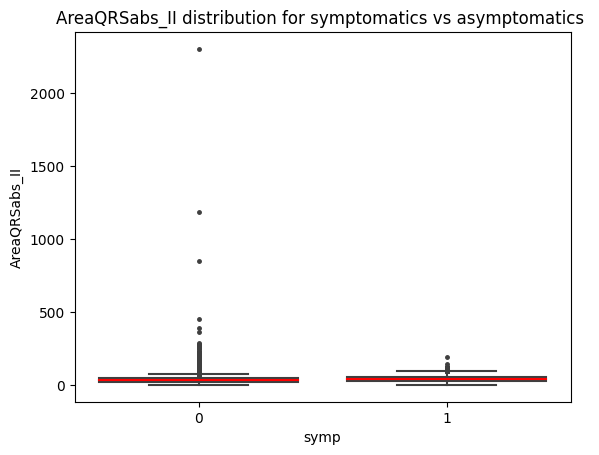

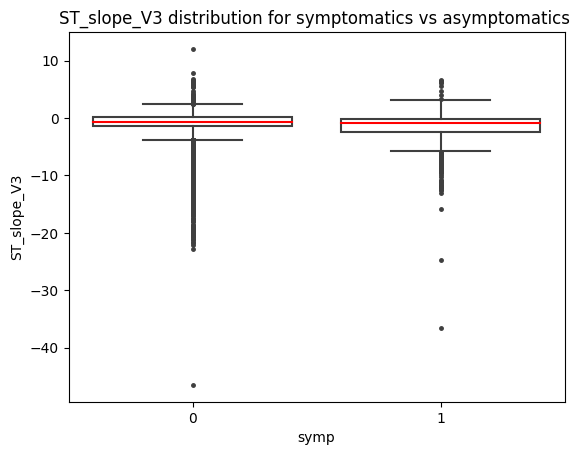

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sb

def boxplot_var_symp(data, var_lead):
  plt.figure()
  
  sb.boxplot(x = data["symp"], y = data[var_lead] ,
             flierprops={"marker": "."},
             boxprops={"facecolor": "None"},
             medianprops={"color": "red"})
  sb.set_color_codes(palette='deep')
  plt.title('{} distribution for symptomatics vs asymptomatics '.format(var_lead))
  # plt.ylim([data.AreaQRSabs_II.min(), 500 ])
  return

# boxplot_var_symp(data_imput_tot, 'PR_I')
# boxplot_var_symp(data_imput_tot, 'ST_60_V3')
# boxplot_var_symp(data_imput_tot, 'ST_60_V2')
# boxplot_var_symp(data_imput_tot, 'LP_QRSd_V3')

for bmk in tot_best_bmk:
    boxplot_var_symp(data_imput_tot, bmk)

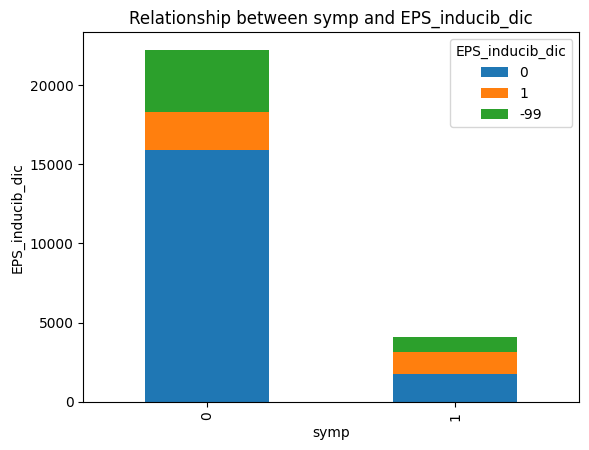

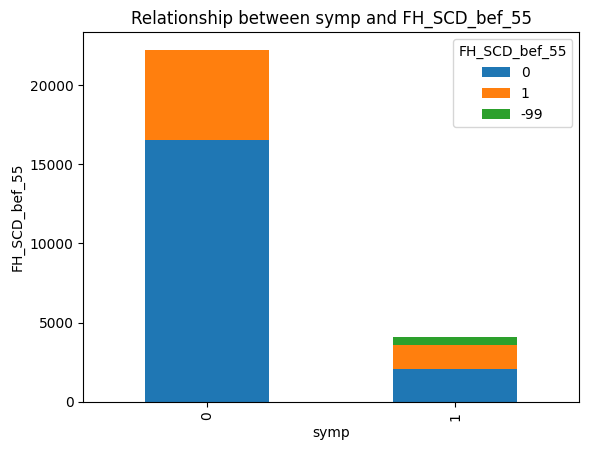

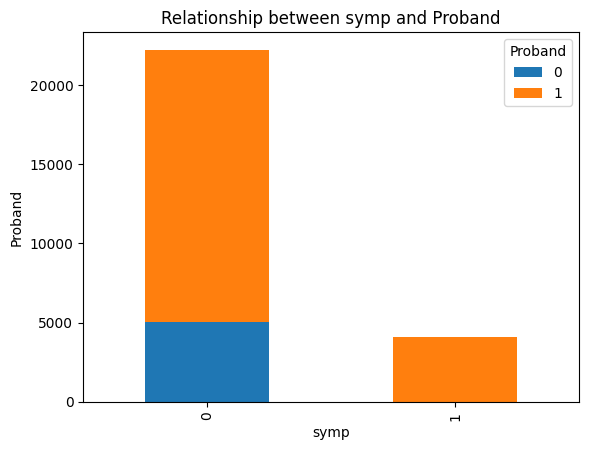

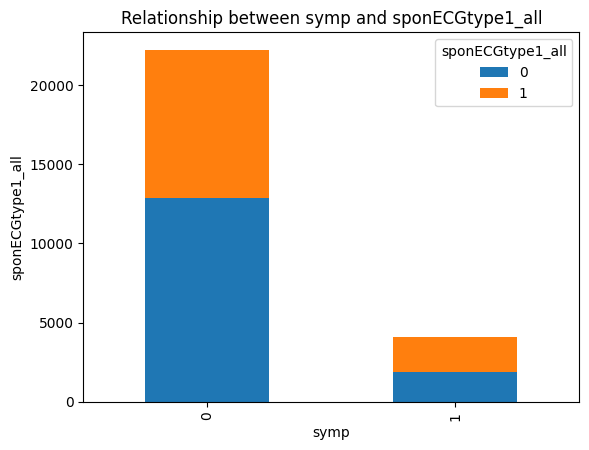

In [ ]:
def stacked_bar_chart(data, cat_var1, cat_var2):
  #group the data
  grouped_df = data.groupby([cat_var1, cat_var2]).size().unstack()

  # stacked bar chart
  grouped_df.plot(kind='bar', stacked=True)

  plt.xlabel(cat_var1)
  plt.ylabel(cat_var2)
  plt.title('Relationship between ' + cat_var1 + ' and ' + cat_var2)
  plt.show()
  return

stacked_bar_chart(data_imput_tot, 'symp', 'EPS_inducib_dic')
stacked_bar_chart(data_imput_tot, 'symp', 'FH_SCD_bef_55')
stacked_bar_chart(data_imput_tot, 'symp', 'Proband')
stacked_bar_chart(data_imput_tot, 'symp', 'sponECGtype1_all')

import plotly.graph_objects as go
from plotly.subplots import make_subplots
def pie_chart_1vs0(data, var):  
  fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])


  fig.add_trace(go.Pie(
      values= data[data.symp == 1].loc[:,var].value_counts(),
      domain=dict(x=[0, 0.5]),
      name="Symptomatic (1)"), 
      row=1, col=1)

  fig.add_trace(go.Pie(
      values= data[data.symp == 0].loc[:,var].value_counts(), 
      domain=dict(x=[0, 0.5]),
      name="Asymptomatic (0)"), 
      row=1, col=2)
 
  fig.update_layout(
    autosize=False,
    width=400,
    height=400,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ))
  fig.show()

pie_chart_1vs0(data_imput_tot, 'sponECGtype1_all')

## *. Analysis of LAS late potentials biomarker
In the calculus of LAS (``l``), inside the function ``latepot_i.m``, a threhshold condition was set to stop the LAS count in 50 ms. When the values anormally overpass this value is because the filtered QRS signal for that beat present anormal low amplitude values that causes the LAS durantion to be extended. 

LAS: low amplitude (<40 µV) signal duration > 38 ms
> 
```python
while df(j)<=0.04  % up to 40 uV
		j=j-1;
        if QRSoff - j > 50
            break
        end
	end
	l=(QRSoff-j)*1000/fs;

```

For that reason, the distribution of this biomarker for asymptomatic and symptomatic condition is evaluated on the original data to see whether it should be better to remove this biomarker. 

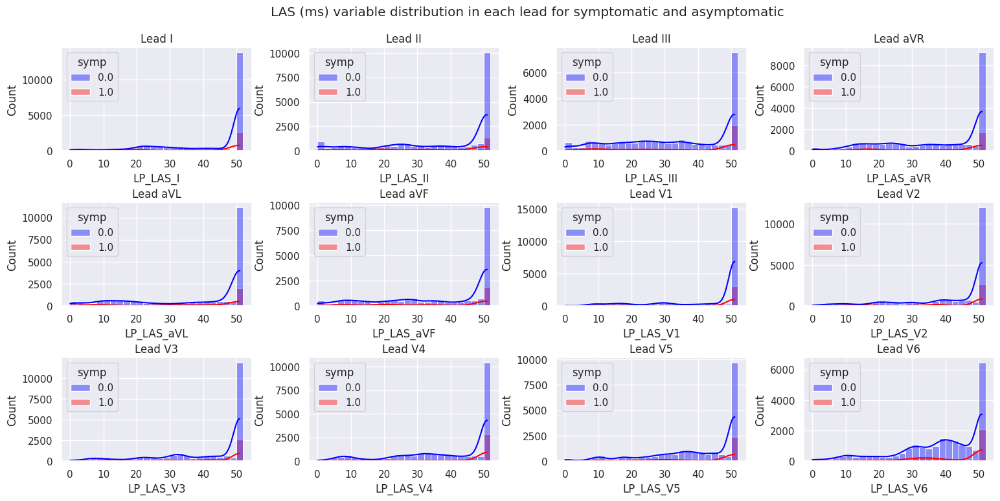

In [ ]:
sb.set(rc={'figure.figsize':(11.7,8.27)})
fig, axes = plt.subplots(3, 4, figsize=(16,8))
fig.suptitle('LAS (ms) variable distribution in each lead for symptomatic and asymptomatic')

leads = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']

for i in range(3):
    for j in range(4):
        lead_index = i*4 + j
        sb.histplot(ax=axes[i, j], data=data, x="LP_LAS_{}".format(leads[lead_index]), hue="symp", kde=True, palette=["blue", "red"], alpha=0.4, edgecolor=None, binwidth=2)
        axes[i,j].set_title("Lead {}".format(leads[lead_index]))
        
fig.subplots_adjust(left=0.05, right=0.95, bottom=0.1, top=0.9, wspace=0.3, hspace=0.5)
plt.show()

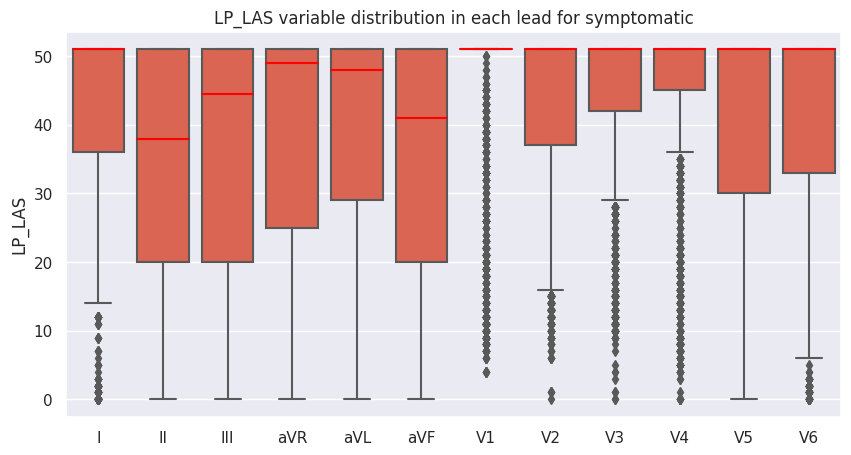

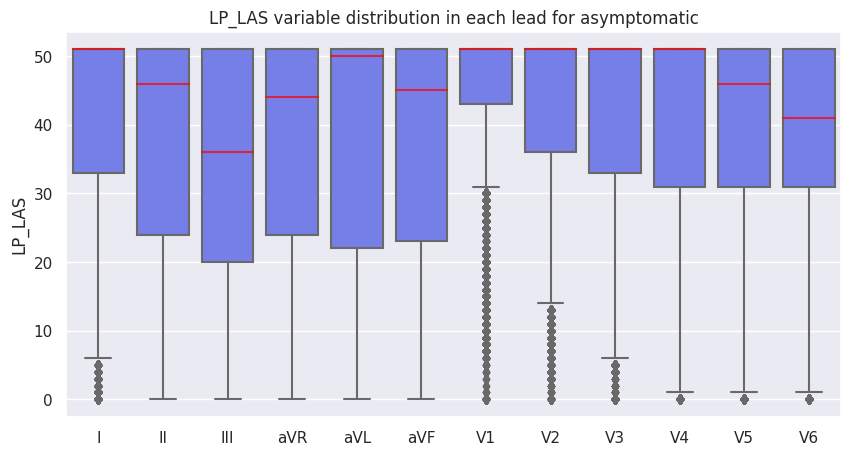

In [ ]:
#SYMPTOMATIC
leads = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
data_symp = data[data.symp == 1]
data_leads = [data_symp['LP_LAS_{}'.format(lead)] for lead in leads]

plt.figure(figsize=(10, 5))
sb.boxplot(data=data_leads, color = '#EF553B',medianprops=dict(color="red"))
plt.xticks(range(len(leads)), leads)
plt.ylabel('LP_LAS')
plt.title('LP_LAS variable distribution in each lead for symptomatic')
plt.show()

#ASYMPTOMATIC
data_asymp = data[data.symp == 0]
data_leads = [data['LP_LAS_{}'.format(lead)] for lead in leads]

plt.figure(figsize=(10, 5))
sb.boxplot(data=data_leads, color = '#636EFA', medianprops=dict(color="red", alpha=0.7))
plt.xticks(range(len(leads)), leads)
plt.ylabel('LP_LAS')
plt.title('LP_LAS variable distribution in each lead for asymptomatic')
plt.show()

From the figures it can be seen that the major part of LAS values lie around 50 ms. This abnormal distribution is observed in both symptomatic and asymptomatic patients, equally. Morover it does not seem to follow a coherent behaviour in patients with the same condition, there are many outliers and high intra-class variability. Therefore, it has been decided to remove the biomarker to avoid introducing meaningless information to the estimator. 

In [ ]:
#drop the LAS column
LAS_cols = ['LP_LAS_{}'.format(lead) for lead in leads]

X_bmk = data_imput.drop(columns = LAS_cols, axis = 1)
X_bmkclc = data_imput_tot.drop(columns = LAS_cols, axis = 1)

## Save the final imputed data that will be used to build the estimators. 
* ``X_bmk``: imputed biomarkers
* ``X_bmkclc``: imputed biomarkers and clinical data

In [ ]:
# #Save the resulting data imputation in excel
from google.colab import files

X_bmk.to_excel('X_bmk.xlsx')  #contains all the final biomarker data
X_bmkclc.to_excel('X_bmkclc.xlsx') #contains all the final biomarker + clinical data

# download the file to local PC
files.download('X_bmk.xlsx')
files.download('X_bmkclc.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>